In [1]:
from ml_aos.dataloader import Donuts
import matplotlib.pyplot as plt
import numpy as np

### Unblended donuts (500k)

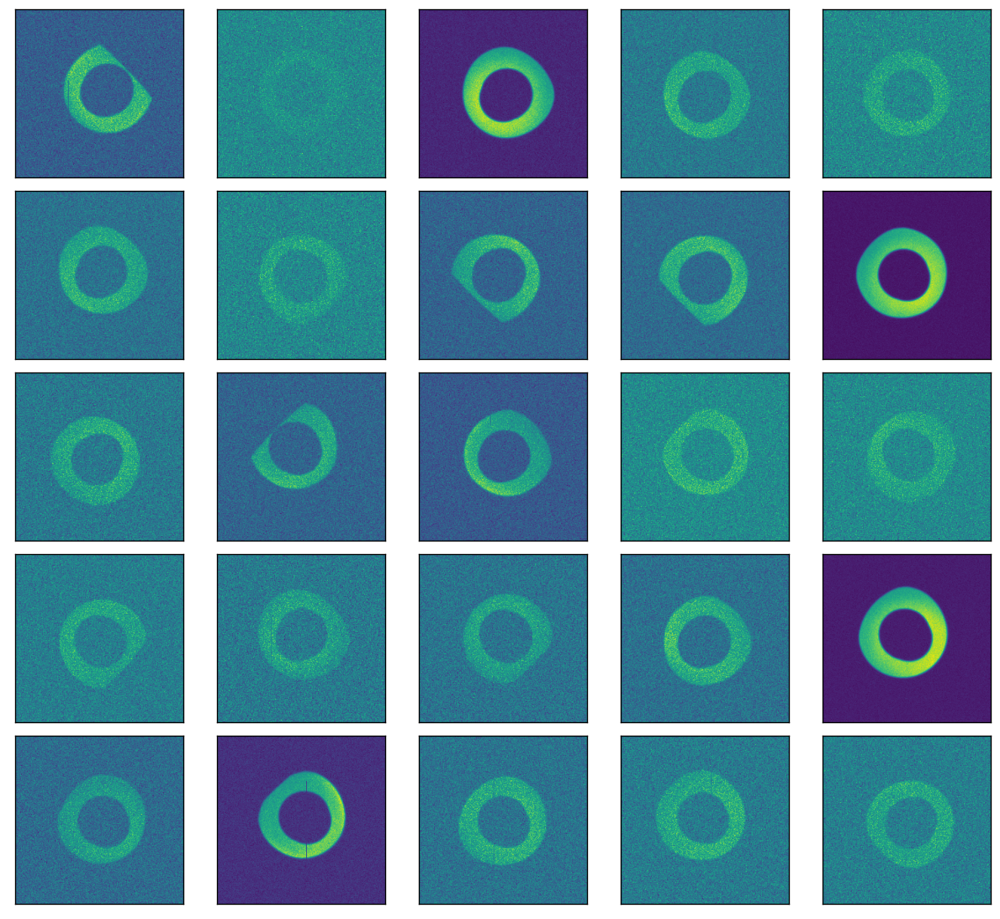

In [2]:
d = Donuts()

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    ax.imshow(d[i]["image"].squeeze())
    ax.set(xticks=[], yticks=[])

### Blended donuts (100k)

Some problems:
1. edge artifacts due to dithering
2. some blends are super blended
3. the target donut isn't always the brightest donut

![Original blends](https://github.com/jfcrenshaw/ml-aos/releases/download/media/original_blends.png)

#### Problem 1: edge artifacts due to dithering

Fixed dithering to eliminate artifacts

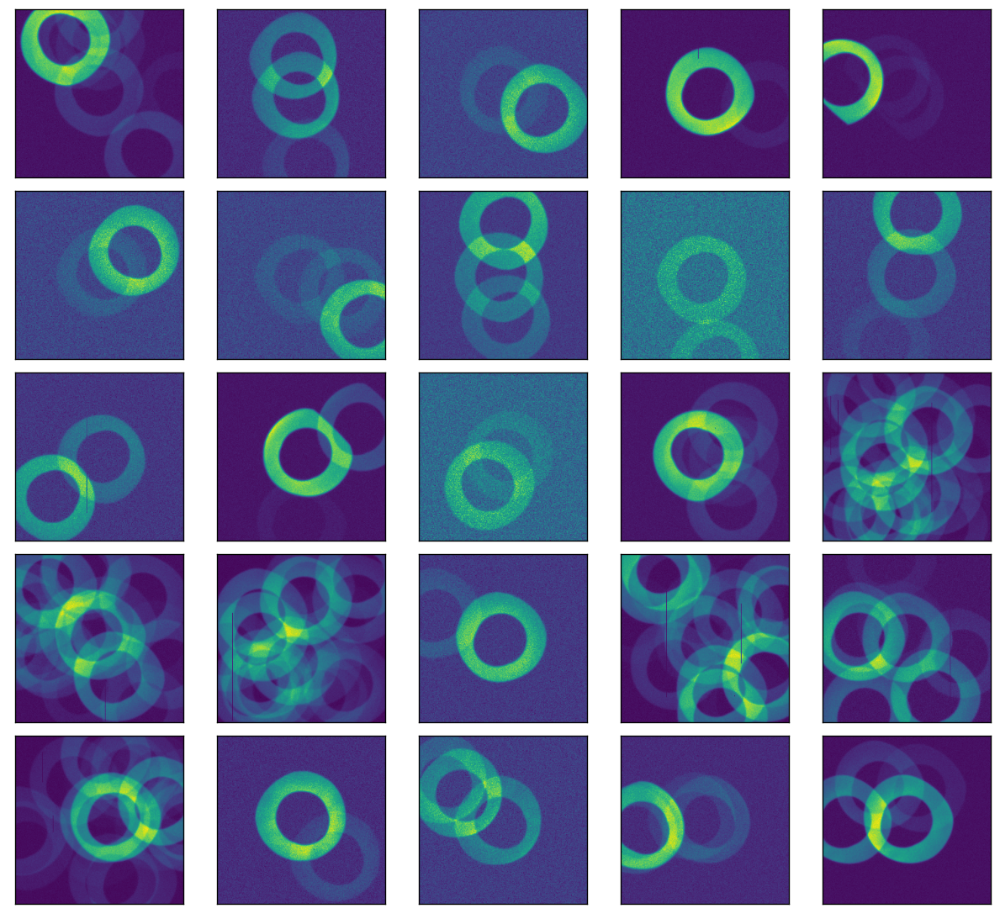

In [3]:
d = Donuts(
    max_blend = 1,
    center_brightest = False,
)

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    ax.imshow(d[d.N_unblended+i]["image"].squeeze())
    ax.set(xticks=[], yticks=[])

#### Problem 2: some blends are super blended

Parameter to specify max blend fraction. Doesn't cut sims with more blending - just doesn't draw the extra stars.

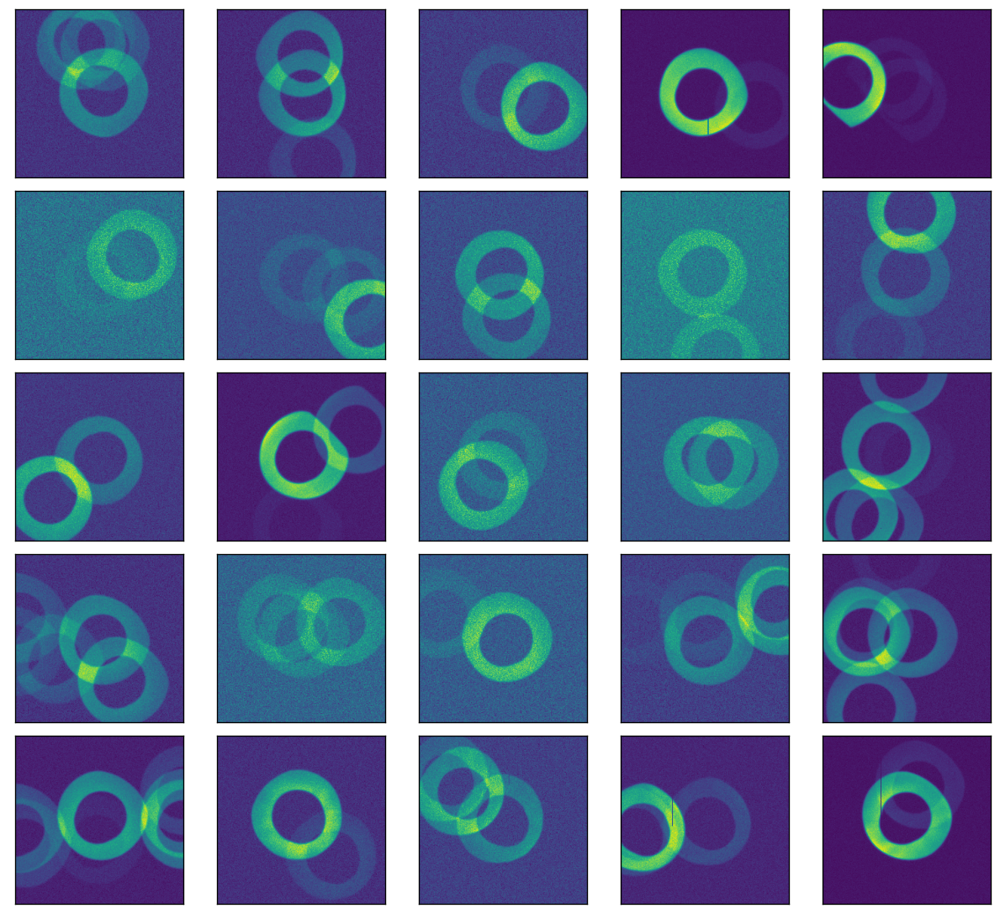

In [4]:
d = Donuts(
    max_blend = 0.35,
    center_brightest = False,
)

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    ax.imshow(d[d.N_unblended+i]["image"].squeeze())
    ax.set(xticks=[], yticks=[])

#### Problem 3: the target donut isn't always the brightest donut

Flag to always center the brightest donut. This makes some blends very lopsided.

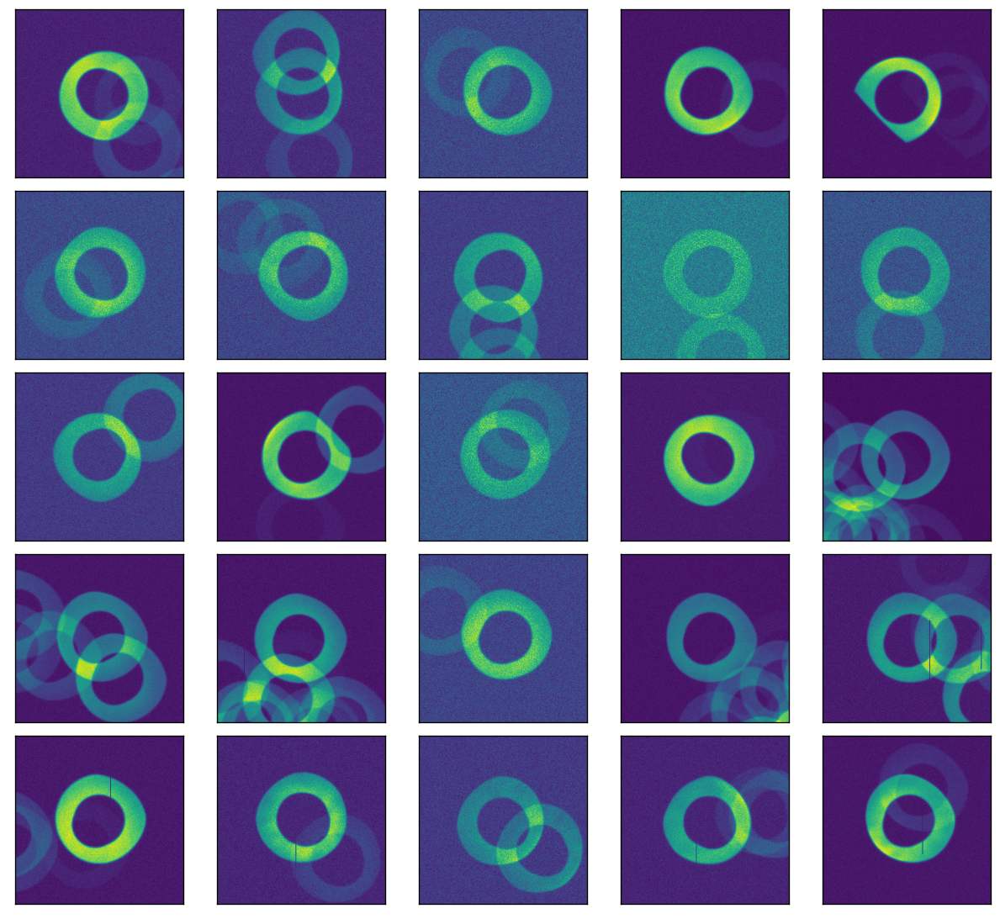

In [5]:
d = Donuts(
    max_blend = 0.35,
    center_brightest = True,
)

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    ax.imshow(d[d.N_unblended+i]["image"].squeeze())
    ax.set(xticks=[], yticks=[])

#### Each image also comes with a mask for the unblended region of the central donut

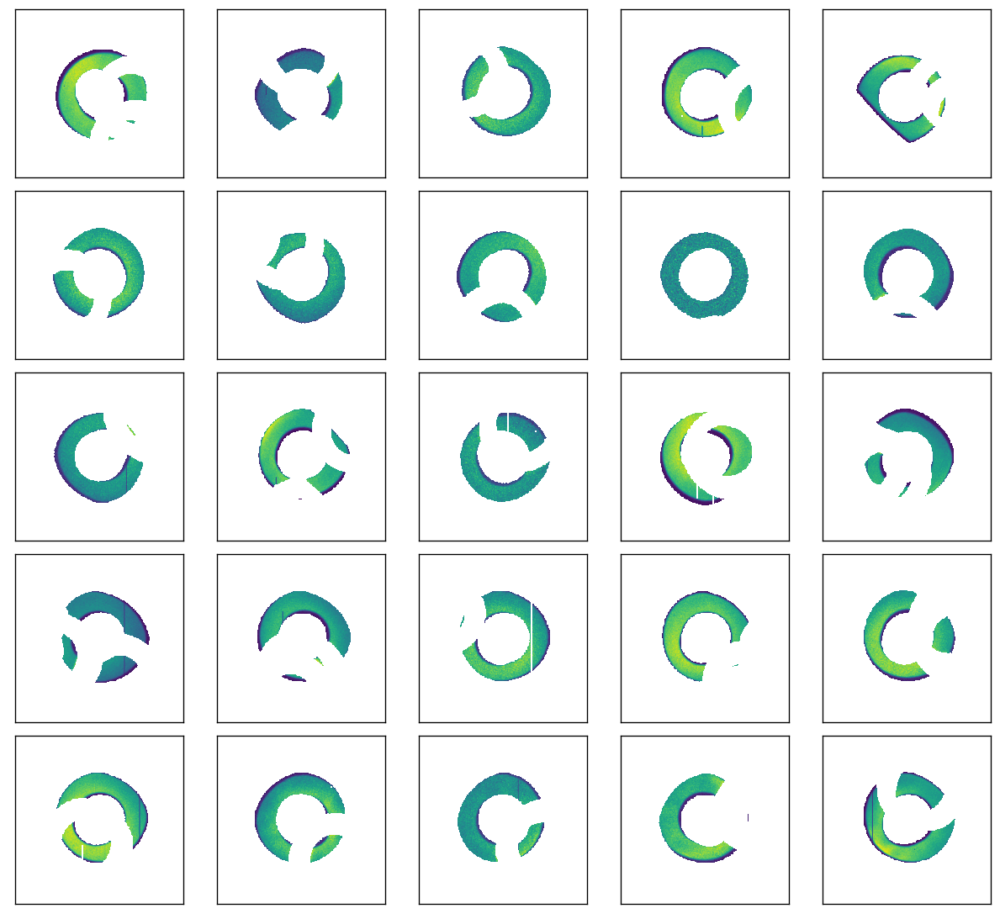

In [6]:
d = Donuts(
    max_blend = 0.35,
    center_brightest = True,
)

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    img = d[d.N_unblended+i]["image"].squeeze()
    mask = d[d.N_unblended+i]["mask"].squeeze()
    img = img.masked_fill(~mask, np.nan)
    ax.imshow(img)
    ax.set(xticks=[], yticks=[])

#### You can also add a buffer around the masks

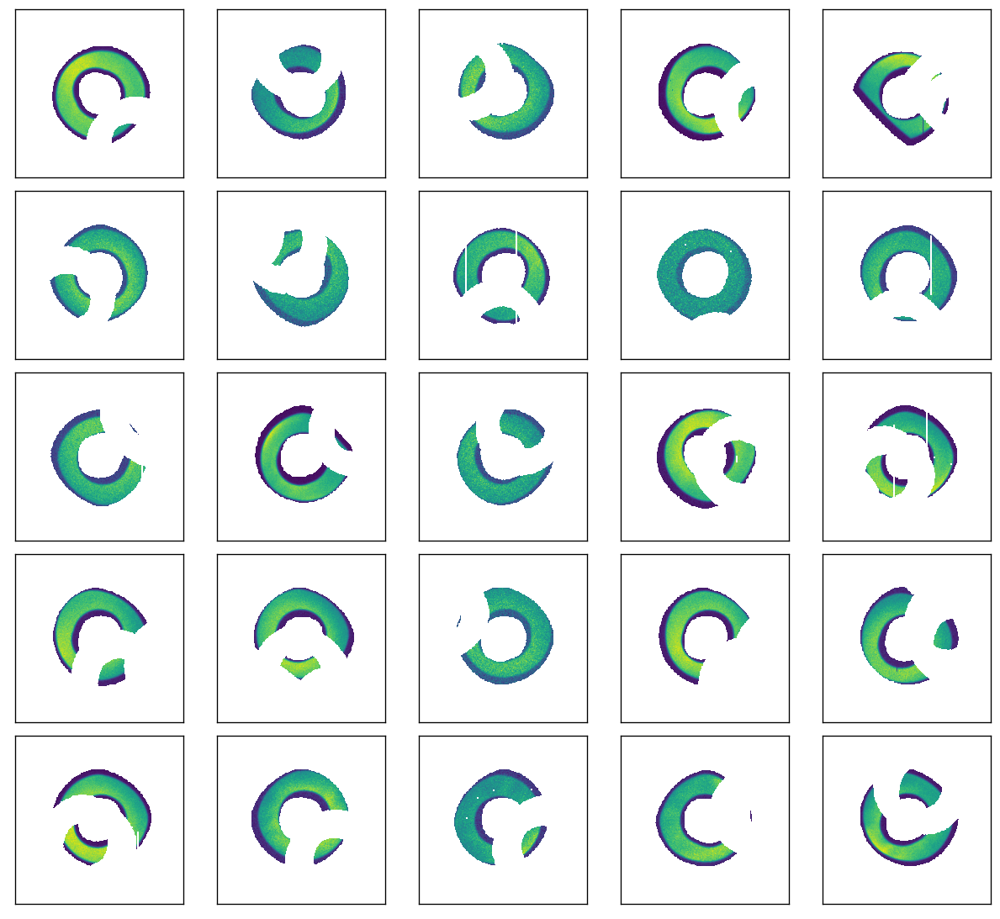

In [7]:
d = Donuts(
    max_blend = 0.35,
    center_brightest = True,
    mask_buffer = 5,
)

fig, axes = plt.subplots(5, 5, figsize=(10, 9), constrained_layout=True, dpi=120)

for i, ax in enumerate(axes.flatten()):

    img = d[d.N_unblended+i]["image"].squeeze()
    mask = d[d.N_unblended+i]["mask"].squeeze()
    img = img.masked_fill(~mask, np.nan)
    ax.imshow(img)
    ax.set(xticks=[], yticks=[])